In [19]:
import pandas as pd
from __future__ import annotations
from pathlib import Path
from itertools import chain

import Bio
from Bio import AlignIO
from Bio.Align import MultipleSeqAlignment
from Bio.Align.AlignInfo import SummaryInfo
from Bio.Align import AlignInfo

import warnings
warnings.filterwarnings("ignore")
import numpy as np
from Bio.motifs import Motif
import glob 
import itertools
import matplotlib.pyplot as plt

from scipy import stats
import seaborn as sns

# Plan:
Get all AD alignments

- Build mega table where each column is one position in an AD
- Each row is count of each AA

so table should have sum(AD lens) cols * 20 rows

In [2]:
counts_dfs = []

print(str(len(glob.glob("../data/zoonomia_toga_mca/all_AD_alignments/*"))) + " alignments")
i = 0

# For each AD alignment
for AD_alignment in glob.glob("../data/zoonomia_toga_mca/all_AD_alignments/*"):
    if i%25 == 0:
        print(i)
    i += 1
    
    # Get msa
    msa = AlignIO.read(AD_alignment, "fasta")
    
    # Get consensus sequence (>50% of positions have that AA)
    summary_align = AlignInfo.SummaryInfo(msa)
    consensus = summary_align.dumb_consensus(0.5)
    
    #Counting each AA
    motif = Motif("ACDEFGHIKLMNPQRSTVWYX-", msa.alignment)
    counts = motif.counts
    
    # Saving as dataframe in desired format
    counts_df = pd.DataFrame(counts).T
    counts_df.columns = list(str(consensus))
    counts_dfs.append(counts_df)

656 alignments
0
25
50
75
100
125
150
175
200
225
250
275
300
325
350
375
400
425
450
475
500
525
550
575
600
625
650


In [3]:
# Wide dataframe where columns are positions in the AD consensus sequences, rows are the 20 AAs
combined_counts_df = pd.concat(counts_dfs, axis = 1)
combined_counts_df

,H,M,M,Y,P,S,P,H,A,V,...,S,S,S,N,E,P,S,S,D,S
A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,471.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
C,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
D,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,479.0,0.0
E,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,479.0,0.0,0.0,0.0,0.0,0.0
F,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
G,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
H,472.0,0.0,0.0,0.0,0.0,0.0,0.0,473.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
I,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
K,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
L,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# Converting to proportions
combined_percents_df = combined_counts_df / combined_counts_df.sum()
combined_percents_df

,H,M,M,Y,P,S,P,H,A,V,...,S,S,S,N,E,P,S,S,D,S
A,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.991579,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
D,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.971602,0.000000
E,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.971602,0.000000,0.000000,0.000000,0.000000,0.000000
F,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
G,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
H,0.993684,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.995789,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
I,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
K,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
L,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [5]:
# Transposing to make future computations easier
combined_percents_df_T = combined_percents_df.T
combined_percents_df_T

,A,C,D,E,F,G,H,I,K,L,...,P,Q,R,S,T,V,W,Y,X,-
H,0.0,0.0,0.000000,0.0,0.0,0.0,0.993684,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.002105,0.004211
M,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.004211
M,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.004211
Y,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.995789,0.000000,0.004211
P,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.989474,0.0,0.0,0.006316,0.0,0.0,0.0,0.000000,0.000000,0.004211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.971602,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.028398
S,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.971602,0.0,0.0,0.0,0.000000,0.000000,0.028398
S,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.971602,0.0,0.0,0.0,0.000000,0.000000,0.028398
D,0.0,0.0,0.971602,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.028398


In [6]:
# Listing all AA pairs
AA_singles = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']
AA_pairs = list(itertools.combinations(AA_singles, 2))
AA_pairs[:5]                                                                         

[('A', 'C'), ('A', 'D'), ('A', 'E'), ('A', 'F'), ('A', 'G')]

In [7]:
# Calculating the change in percent identity for each pair 
# Let P(...) be the percent identity of a ... 
# min(delta P(pair)) = min(P(pair) - P(AA1), P(pair) - P(AA2))
# min(delta P(pair)) = min(P(AA1) + P(AA2) - P(AA1), P(AA1) + P(AA2) - P(AA2))
# min(delta P(pair)) = min(P(AA2), P(AA1))

AA_pair_col_names = []

for AA1, AA2 in AA_pairs:
    AA_pair_col_names.append(AA1 + AA2)
    combined_percents_df_T[AA1 + AA2] = combined_percents_df_T[[AA1, AA2]].min(axis = 1) # Take the minimum of P(AA1) and P(AA2) because this equals minimum change in percent identity for the pair

In [8]:
combined_percents_df_T

,A,C,D,E,F,G,H,I,K,L,...,ST,SV,SW,SY,TV,TW,TY,VW,VY,WY
H,0.0,0.0,0.000000,0.0,0.0,0.0,0.993684,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
M,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
M,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Y,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
P,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
S,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
S,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
D,0.0,0.0,0.971602,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
# Only keep pairs
pair_df = combined_percents_df_T.loc[:, AA_pair_col_names]
pair_df

,AC,AD,AE,AF,AG,AH,AI,AK,AL,AM,...,ST,SV,SW,SY,TV,TW,TY,VW,VY,WY
H,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
M,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
M,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
S,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
S,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
D,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
# Goal: for each position, keep only pairs which contain corresponding consensus AA 

# Create a mask of whether column name does not contain row index letter - to conver tot null later
mask = pair_df.columns.to_list()  
index_matrix = np.array([mask[i].find(row_idx) != -1 # Column name does not contain row index
                         for row_idx in pair_df.index # Iterate through row indices
                         for i in range(len(mask))]) # Iterate through columns
index_matrix = index_matrix.reshape(len(pair_df), len(pair_df.columns)) # Save in shape of dataframe                                                            
index_matrix

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False,  True, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [11]:
# Create mutable array then convert values to remove to nulls
index_array = np.array(pair_df.values)
index_array[~index_matrix] = np.nan
null_imputed_df = pd.DataFrame(index_array)
null_imputed_df.columns = pair_df.columns
null_imputed_df.index = pair_df.index
null_imputed_df

,AC,AD,AE,AF,AG,AH,AI,AK,AL,AM,...,ST,SV,SW,SY,TV,TW,TY,VW,VY,WY
H,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0
P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
D,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
# Reset index to prepare to melt 
null_imputed_df = null_imputed_df.reset_index()
null_imputed_df

,index,AC,AD,AE,AF,AG,AH,AI,AK,AL,...,ST,SV,SW,SY,TV,TW,TY,VW,VY,WY
0,H,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0
4,P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79051,P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
79052,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
79053,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
79054,D,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# Now melt so that each row is one of the 190 pairs at each of 79k locations
melted = pd.melt(null_imputed_df, id_vars = ['index'], value_vars = AA_pair_col_names)
melted

,index,variable,value
0,H,AC,NaN
1,M,AC,NaN
2,M,AC,NaN
3,Y,AC,NaN
4,P,AC,NaN
...,...,...,...
15020635,P,WY,NaN
15020636,S,WY,NaN
15020637,S,WY,NaN
15020638,D,WY,NaN


In [14]:
# Drop nulls since these are pairs which do not include consensus AA
melted = melted.dropna()
melted

,index,variable,value
8,A,AC,0.0
12,A,AC,0.0
18,A,AC,0.0
27,A,AC,0.0
31,A,AC,0.0
...,...,...,...
15020454,W,WY,0.0
15020567,Y,WY,0.0
15020571,W,WY,0.0
15020605,Y,WY,0.0


In [15]:
# As expected, there are 19 possible columns for each index AA
melted[["index", "variable"]].drop_duplicates()[["index"]].value_counts()

index
A        19
C        19
W        19
V        19
T        19
S        19
R        19
Q        19
P        19
N        19
M        19
L        19
K        19
I        19
H        19
G        19
F        19
E        19
D        19
Y        19
Name: count, dtype: int64

In [16]:

# Q: SHOULD I DROP ZEROS?
# A: No because 0 is meaningful, actually tells you that adding that AA to thte consensus seq AA did not change percent identity


# melted = melted[melted["value"] != 0]
# melted

In [17]:
# # Surprisingly there are 19 possible columns which remain for each index AA
# melted[["index", "variable"]].drop_duplicates()[["index"]].value_counts()

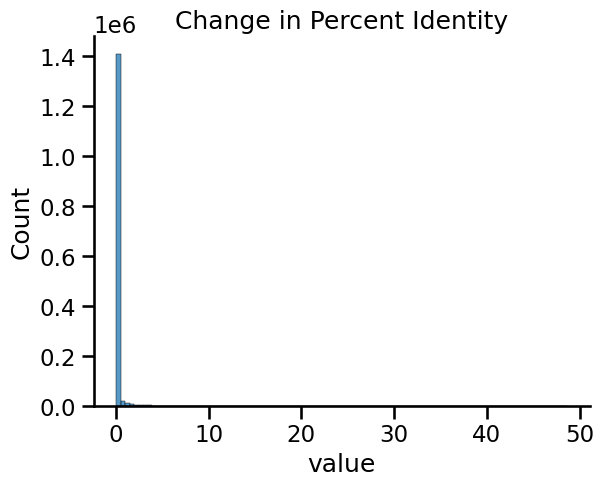

In [20]:
sns.set_context('talk')
sns.histplot(100 * melted["value"], bins = 100)
plt.title("Change in Percent Identity")
sns.despine()

In [21]:
def compare_pair(pair, 
                 plot = True, 
                 means = False,
                 t_test = True):
    # Plot
    melted_pair = melted[melted["variable"] == pair]
    melted_not_pair = melted[melted["variable"] != pair]

    if plot:
        max_x = max(melted["value"])
        bins = np.arange(0, max_x * 100, 1)
        
        sns.set_context('talk')
        sns.histplot(100 * melted_not_pair["value"], bins = bins, label = "Other Pairs", stat = "density")
        sns.histplot(100 * melted_pair["value"], bins = bins, label = pair, stat = "density")

        if means == True:
            plt.axvline(100 * np.mean(melted_not_pair["value"]), color = sns.color_palette()[0], linestyle = "--")
            plt.axvline(100 * np.mean(melted_pair["value"]), color = sns.color_palette()[1], linestyle = "--")

        plt.legend()
        plt.title("")
        plt.xlabel("Change in Percent Identity\nPer AD Residue")
        sns.despine()

    if t_test:
        return stats.ttest_ind(melted_pair["value"], melted_not_pair["value"], alternative = "greater")[1]

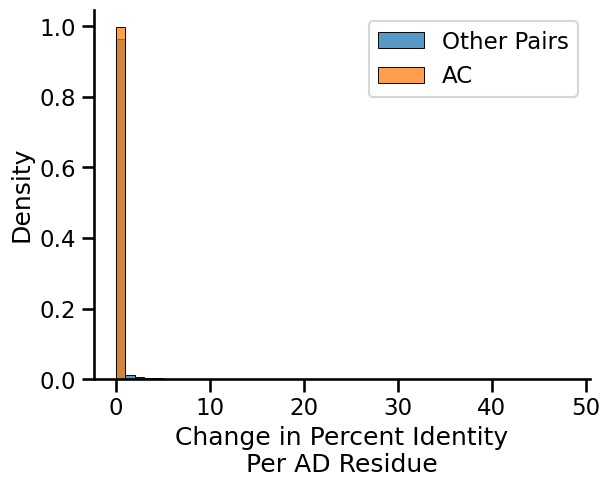

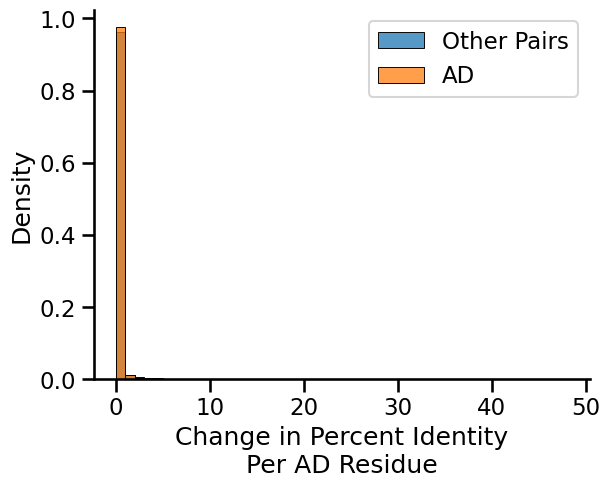

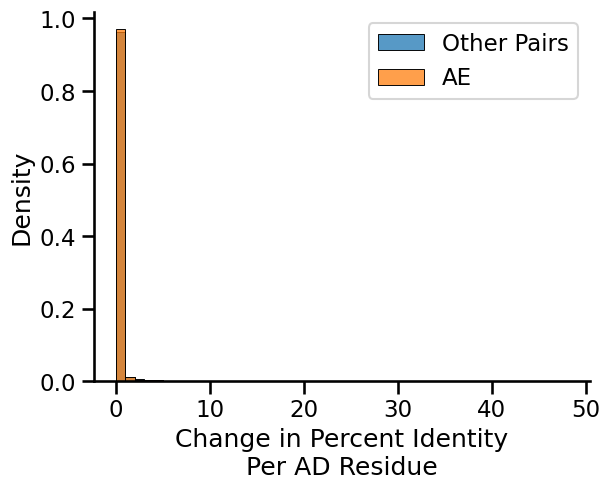

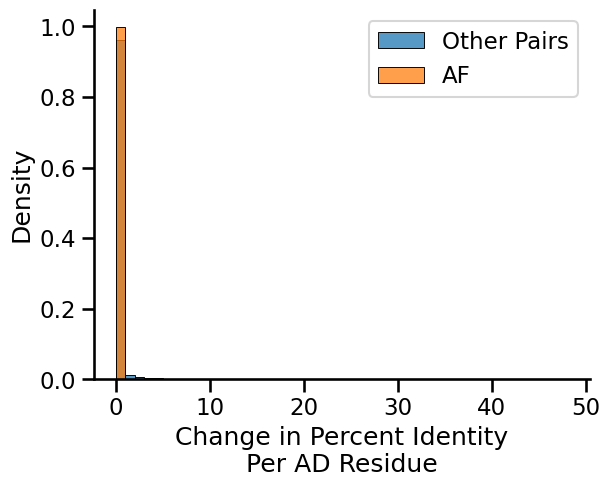

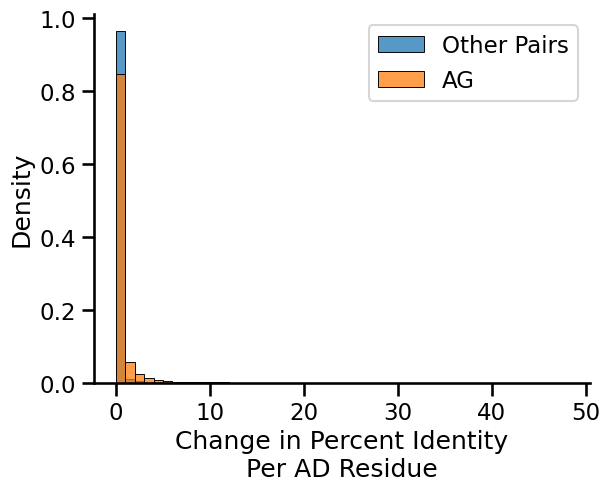

...

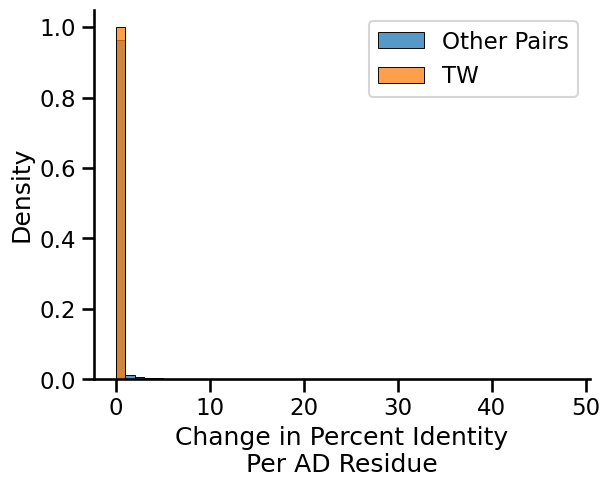

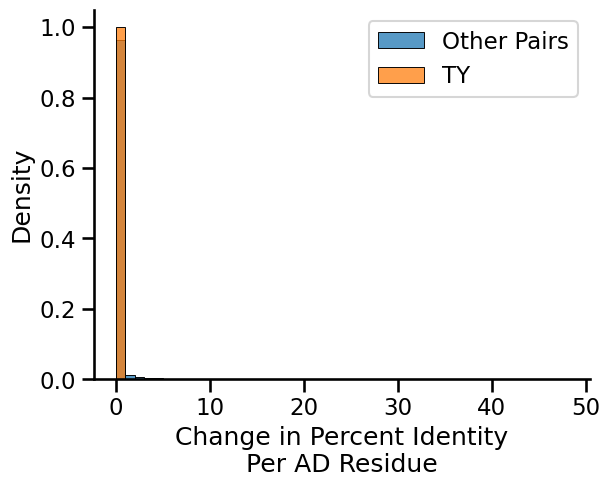

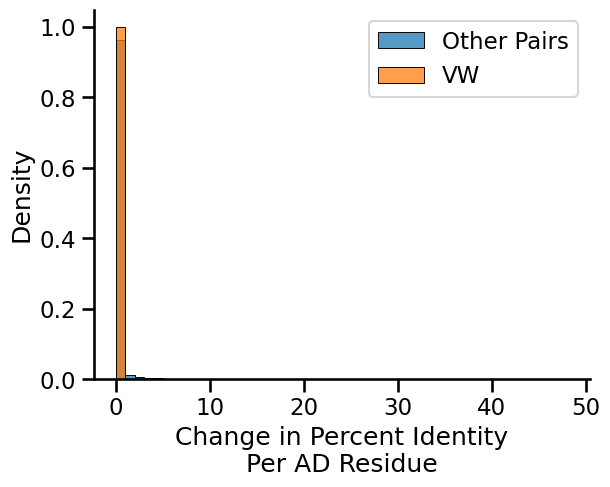

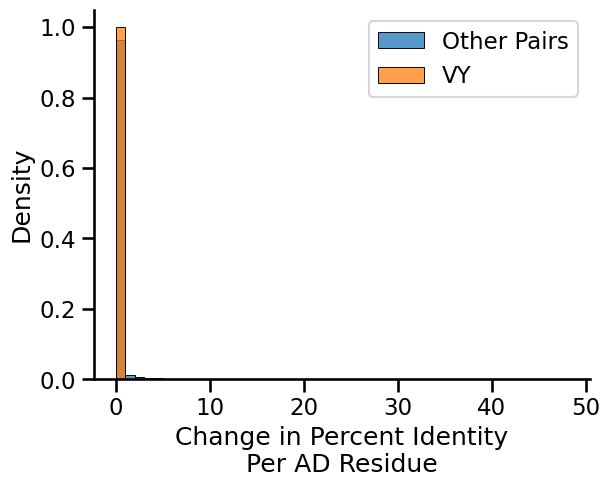

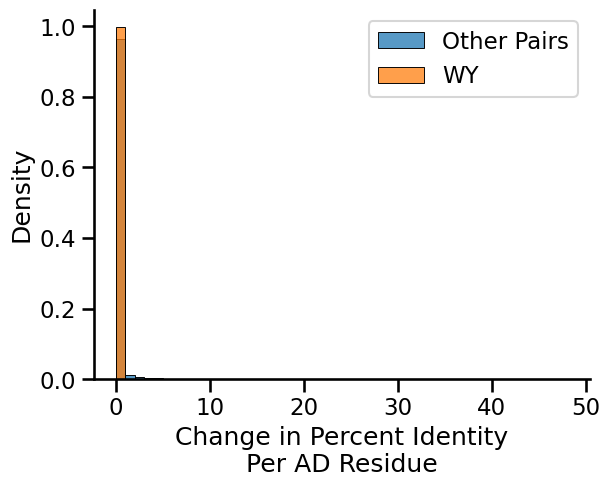

,pair,p_val
0,AC,1.000000
1,AD,1.000000
2,AE,0.999998
3,AF,1.000000
4,AG,0.000000
...,...,...
185,TW,1.000000
186,TY,1.000000
187,VW,1.000000
188,VY,1.000000


In [22]:
p_vals = []

for pair in AA_pair_col_names:
    p_vals.append(compare_pair(pair))
    plt.show()

p_val_df = pd.DataFrame({"pair" : AA_pair_col_names, "p_val" : p_vals})
p_val_df

In [23]:
sig_pairs = p_val_df[p_val_df["p_val"] < 0.05 / len(p_val_df)].sort_values(by = "p_val")
sig_pairs#[:10]

,pair,p_val
4,AG,0.000000e+00
164,PS,0.000000e+00
162,PQ,0.000000e+00
157,NS,0.000000e+00
151,MV,0.000000e+00
121,IV,0.000000e+00
94,GS,0.000000e+00
180,ST,0.000000e+00
11,AP,0.000000e+00
14,AS,0.000000e+00


5.984594757439324e-08

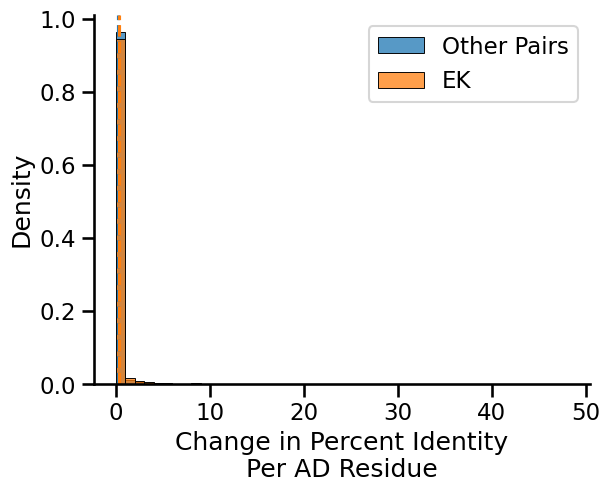

In [24]:
compare_pair("EK", means = True)

0.0

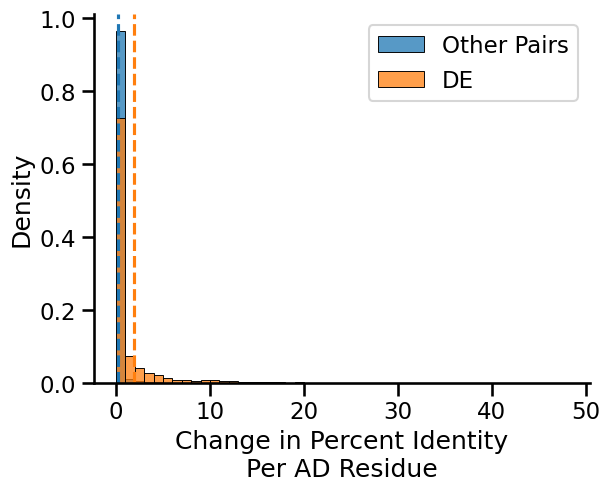

In [25]:
compare_pair("DE", means = True)

5.984594757439324e-08

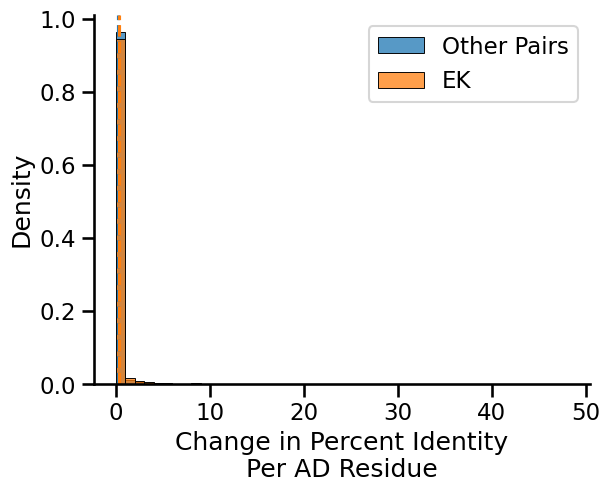

In [26]:
# Plots are not convincing of doing what I expect

compare_pair("EK", means = True)

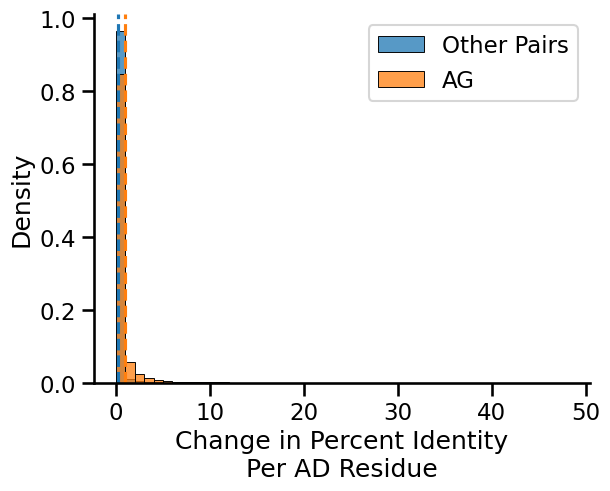

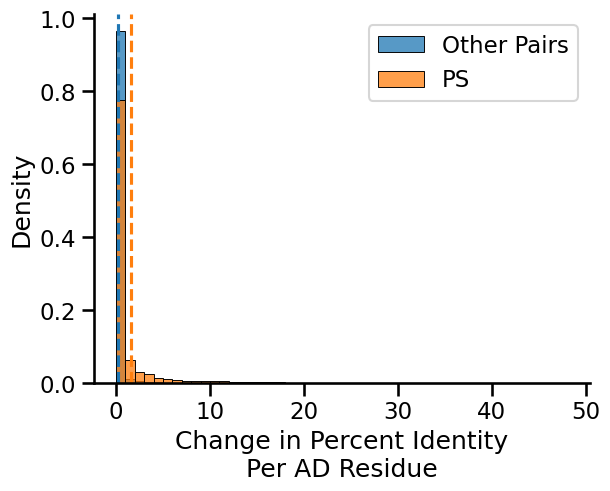

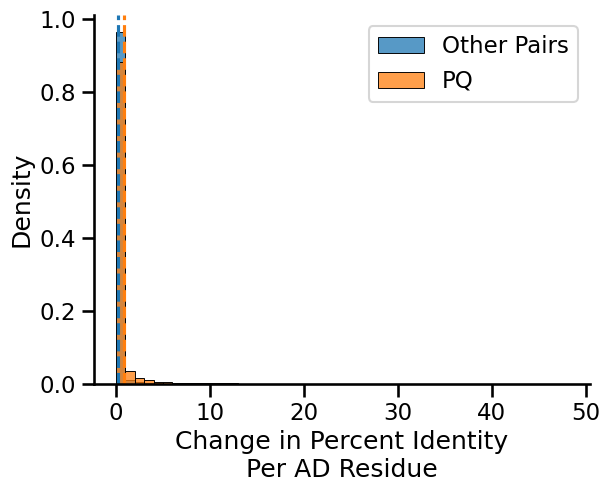

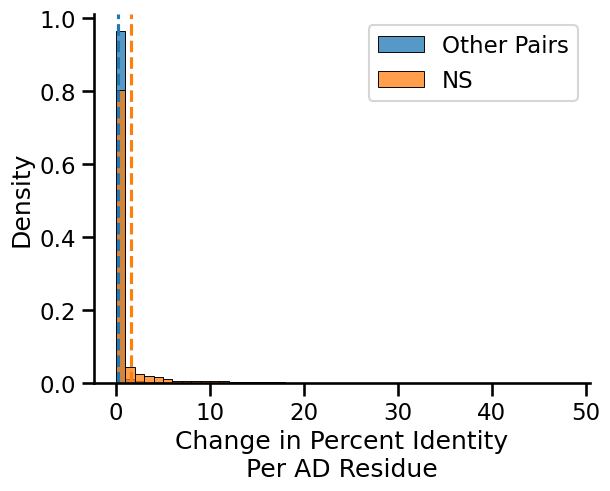

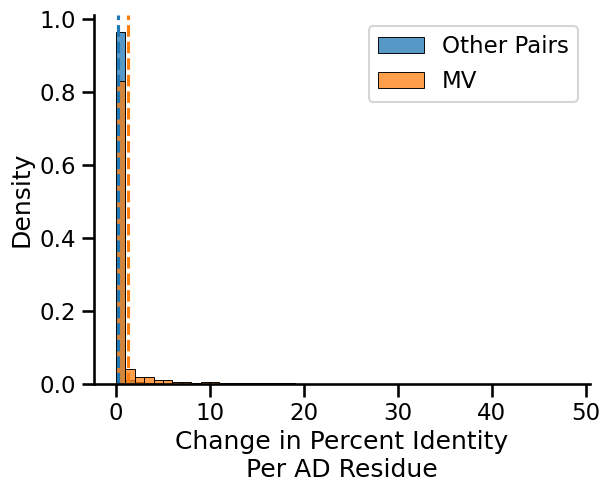

...

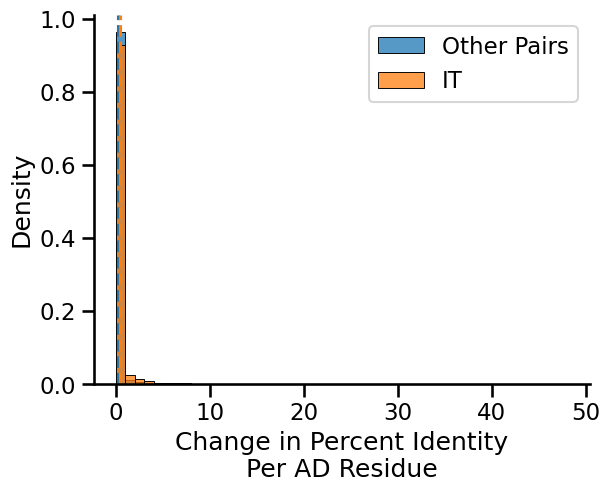

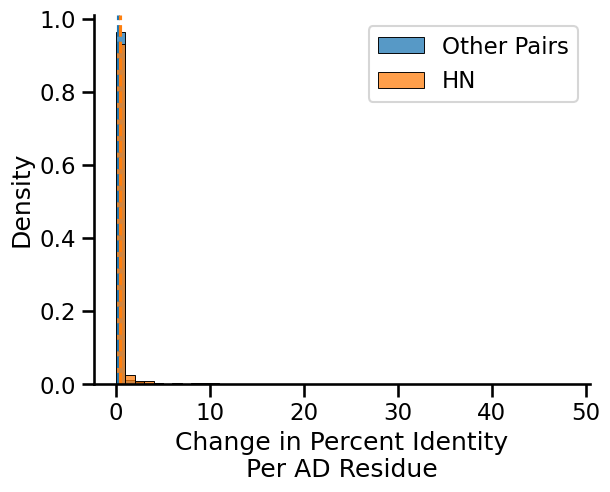

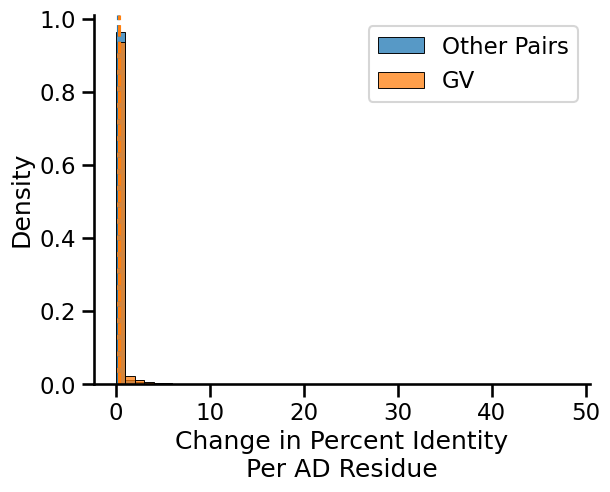

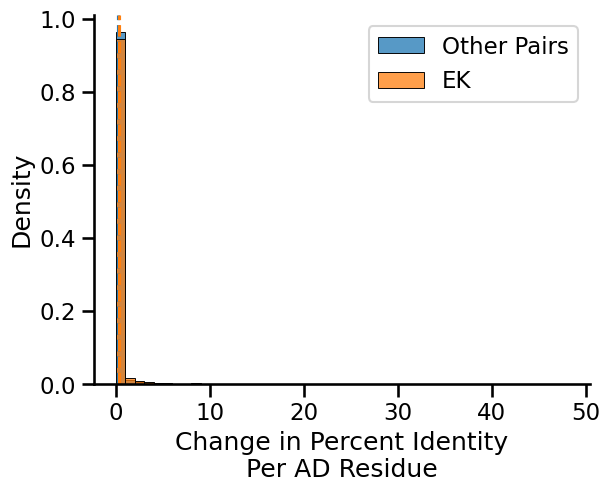

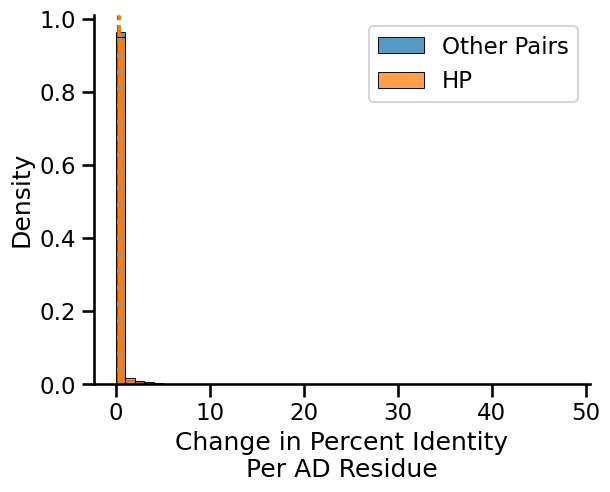

In [27]:
for pair in sig_pairs["pair"]:
    compare_pair(pair, means = True)
    plt.show()

In [28]:
# New plan - bootstrapping
# For each pair, count number of rows in melted which equal that pair
# Get 10,000 random samples of same size, and for each calculate the mean value
# Get p value of observed mean vs distribution of means

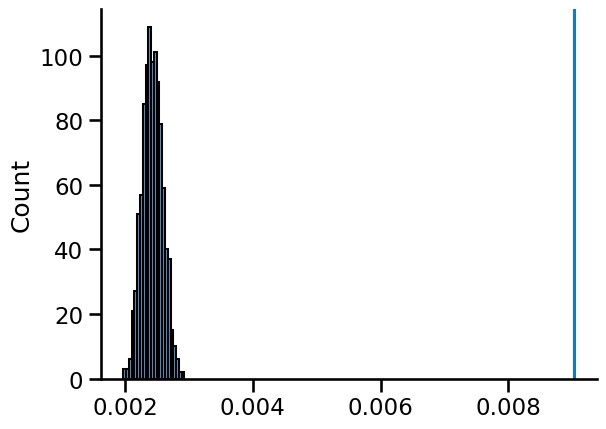

In [29]:
pair = "AG"

sns.set_context('talk')

# Calculating mean of pair
obs = melted[melted["variable"] == pair]
obs_mean = np.mean(obs["value"])

# Sampling with same size as obs
sample_means = []
for i in range(1000):
    sampled_df = melted.sample(n=len(obs), replace=True)
    sample_mean = np.mean(sampled_df["value"])
    sample_means.append(sample_mean)

sns.histplot(sample_means)
plt.axvline(obs_mean)
sns.despine()

In [30]:
obs_mean - np.mean(sample_means)

0.006602339927999178

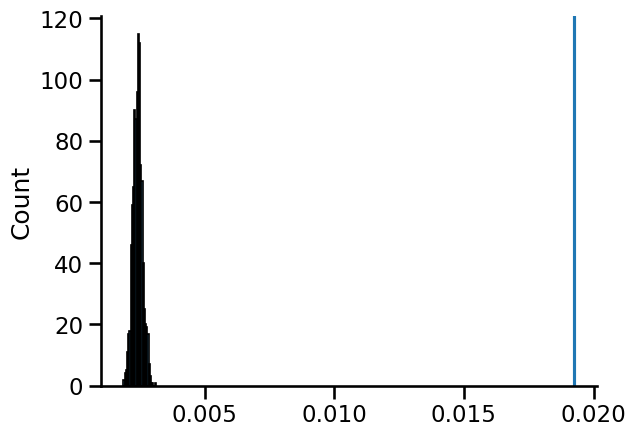

In [31]:
pair = "DE"

sns.set_context('talk')

# Calculating mean of pair
obs = melted[melted["variable"] == pair]
obs_mean = np.mean(obs["value"])

# Sampling with same size as obs
sample_means = []
for i in range(1000):
    sampled_df = melted.sample(n=len(obs), replace=True)
    sample_mean = np.mean(sampled_df["value"])
    sample_means.append(sample_mean)

sns.histplot(sample_means)
plt.axvline(obs_mean)
sns.despine()

In [32]:
obs_mean - np.mean(sample_means)

0.016834315038031778

In [33]:
melted[melted["value"] > 0.05]

,index,variable,value
29826,C,AC,0.090722
48968,A,AC,0.103359
50026,C,AC,0.098655
80268,A,AD,0.135484
80297,D,AD,0.081720
...,...,...,...
14621725,V,TV,0.080247
14690835,W,TW,0.072626
14838045,W,VW,0.118143
14990873,Y,WY,0.084257


Text(0.5, 0, 'Change in Percent Identity')

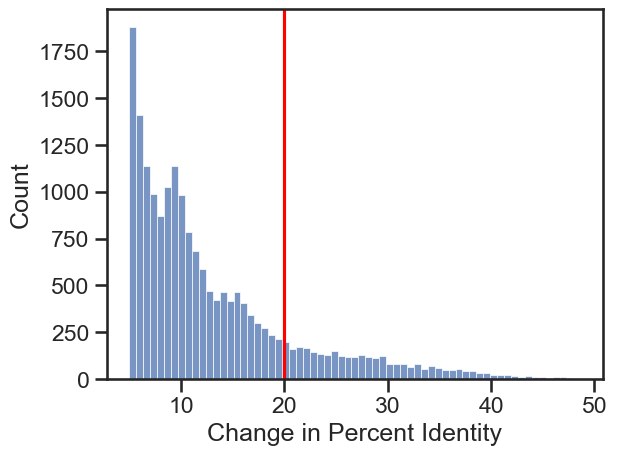

In [72]:
sns.histplot(melted[melted["value"] > 0.05]["value"] * 100)
plt.axvline(20, color = "red")
plt.xlabel("Change in Percent Identity")

In [35]:
406 / 10045

0.04041811846689895

In [36]:
182 / 8900

0.02044943820224719

In [37]:
len(melted[melted["value"] > 0.2]) / len(melted)

0.002058059948076469

In [38]:
melted[melted["value"] > 0.2]["variable"].value_counts()["DE"]/ len(melted[melted["variable"] == "DE"])

0.017613386173491855

In [39]:
melted[melted["value"] > 0.2]["variable"].value_counts()["AT"]/ len(melted[melted["variable"] == "DE"])

0.04095112285336856

In [40]:
melted[melted["value"] > 0.2]["variable"].value_counts()["PQ"]/ len(melted[melted["variable"] == "DE"])

0.011999119330691326

In [41]:
melted[melted["value"] > 0.2]["variable"].value_counts()["AT"]

372

In [42]:
melted[melted["value"] < 0.2]["variable"].value_counts()["AT"]

10082

In [43]:
melted[melted["value"] > 0.2]["variable"].value_counts()["DE"]

160

In [44]:
melted[melted["value"] < 0.2]["variable"].value_counts()["DE"]

8924

In [45]:
melted[melted["value"] > 0.2]["variable"].value_counts()[:10]

variable
AT    372
GS    349
PS    266
NS    230
DE    160
AV    113
IV    113
PQ    109
AS     95
AG     91
Name: count, dtype: int64

In [46]:
sns.set_context('talk')

def return_p_val_and_mean_diff(pair, plot = True):
    # Calculating mean of pair
    obs = melted[melted["variable"] == pair]
    obs_mean = np.mean(obs["value"])
    
    # Sampling with same size as obs
    sample_means = []
    for i in range(100):
        sampled_df = melted.sample(n=len(obs), replace=True)
        sample_mean = np.mean(sampled_df["value"])
        sample_means.append(sample_mean)

    if plot:
        sns.histplot(sample_means)
        plt.axvline(obs_mean)
        sns.despine()
        plt.title(pair)

    return sum((sample_means > obs_mean) ) / len(sample_means), obs_mean
    


In [47]:
np.sum(np.abs(sample_means - np.mean(sample_means)) >= np.abs(obs_mean - np.mean(sample_means))) / len(sample_means)

0.0

(0.0, 0.019256523847459617)

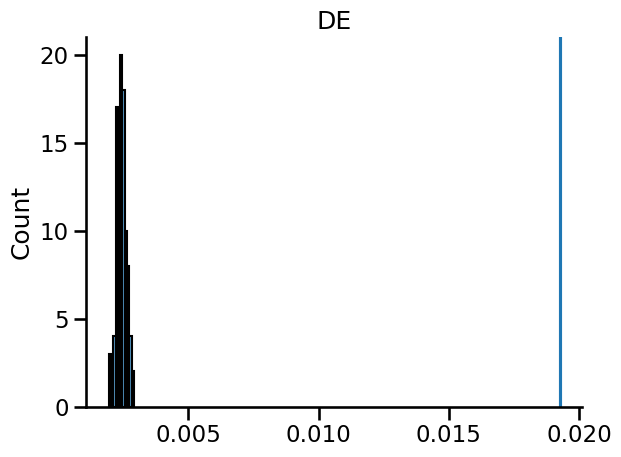

In [48]:
return_p_val_and_mean_diff("DE")

In [49]:
sampling_p_vals, sampling_mean_diffs = [], []

i = 0

for pair in AA_pair_col_names:

    if i % 20 == 0:
        print(i)    

    i += 1

    
    p_val, mean_diff = return_p_val_and_mean_diff(pair, plot = False)
    sampling_p_vals.append(p_val)
    sampling_mean_diffs.append(mean_diff)

sampling_p_val_df = pd.DataFrame({"pair" : AA_pair_col_names, "p_val" : sampling_p_vals, "mean_diff" : sampling_mean_diffs})
sampling_p_val_df

0
20
40
60
80
100
120
140
160
180


,pair,p_val,mean_diff
0,AC,1.0,0.000149
1,AD,1.0,0.001314
2,AE,1.0,0.001656
3,AF,1.0,0.000135
4,AG,0.0,0.009033
...,...,...,...
185,TW,1.0,0.000032
186,TY,1.0,0.000031
187,VW,1.0,0.000051
188,VY,1.0,0.000036


(0.0, 0.031314101752893495)

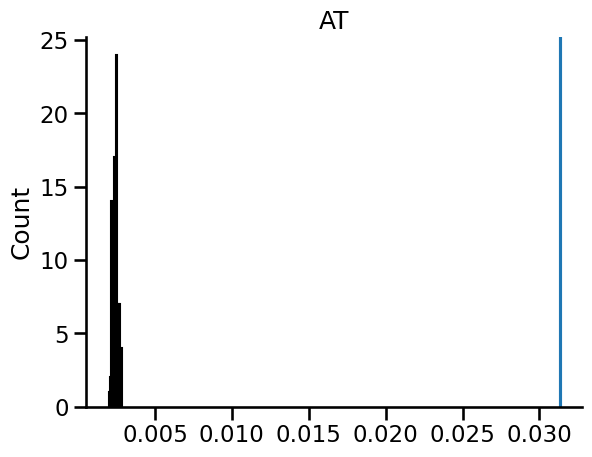

In [50]:
return_p_val_and_mean_diff("AT")

<Axes: xlabel='p_val', ylabel='Count'>

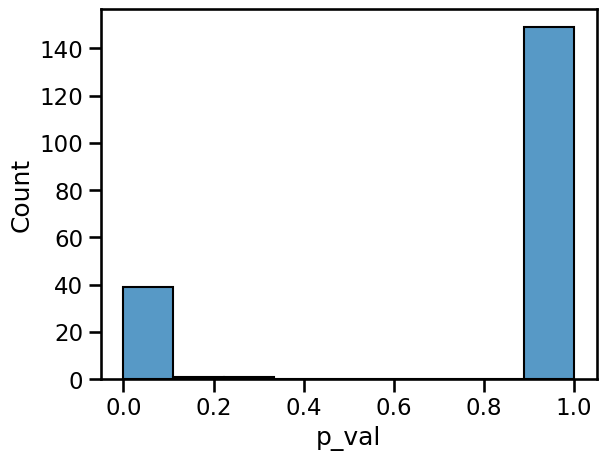

In [51]:
sns.histplot(sampling_p_val_df["p_val"])

In [52]:
sampling_p_val_df[sampling_p_val_df["p_val"] == 1]

,pair,p_val,mean_diff
0,AC,1.0,0.000149
1,AD,1.0,0.001314
2,AE,1.0,0.001656
3,AF,1.0,0.000135
5,AH,1.0,0.000128
...,...,...,...
185,TW,1.0,0.000032
186,TY,1.0,0.000031
187,VW,1.0,0.000051
188,VY,1.0,0.000036


In [53]:
sampling_p_val_df[sampling_p_val_df["p_val"] <= 0.05].sort_values(by = "mean_diff", ascending = False)

,pair,p_val,mean_diff
15,AT,0.0,0.031314
37,DE,0.0,0.019257
94,GS,0.0,0.017465
157,NS,0.0,0.016250
164,PS,0.0,0.015629
121,IV,0.0,0.015629
16,AV,0.0,0.013128
151,MV,0.0,0.012609
180,ST,0.0,0.009368
129,KR,0.0,0.009271


In [54]:
sampling_p_val_df["AA1"] = sampling_p_val_df["pair"].str[0]
sampling_p_val_df["AA2"] = sampling_p_val_df["pair"].str[1]
sampling_p_val_df["1-p_val"] = 1 - sampling_p_val_df["p_val"]
sampling_p_val_df["mean_diff"] = 100 * sampling_p_val_df["mean_diff"]
sampling_p_val_df

,pair,p_val,mean_diff,AA1,AA2,1-p_val
0,AC,1.0,0.014901,A,C,0.0
1,AD,1.0,0.131403,A,D,0.0
2,AE,1.0,0.165629,A,E,0.0
3,AF,1.0,0.013482,A,F,0.0
4,AG,0.0,0.903322,A,G,1.0
...,...,...,...,...,...,...
185,TW,1.0,0.003199,T,W,0.0
186,TY,1.0,0.003145,T,Y,0.0
187,VW,1.0,0.005086,V,W,0.0
188,VY,1.0,0.003584,V,Y,0.0


In [55]:
len(set(sampling_p_val_df["AA1"]))

19

In [56]:
len(set(sampling_p_val_df["AA2"]))

19

In [57]:
AA_order = ["A", "T", "S", "N", "G", "V", "P", "I", "E", "D", "M", "Q", "H", "R", "L", "C", "K", "F", "Y", "W"]
AA_order_dict = dict(zip(AA_order, np.arange(20)))
AA_order_dict

{'A': 0,
 'T': 1,
 'S': 2,
 'N': 3,
 'G': 4,
 'V': 5,
 'P': 6,
 'I': 7,
 'E': 8,
 'D': 9,
 'M': 10,
 'Q': 11,
 'H': 12,
 'R': 13,
 'L': 14,
 'C': 15,
 'K': 16,
 'F': 17,
 'Y': 18,
 'W': 19}

In [58]:
new_AA1s = []
new_AA2s = []

for i in range(len(sampling_p_val_df)):
    AA1 = sampling_p_val_df["AA1"].iloc[i]
    AA2 = sampling_p_val_df["AA2"].iloc[i]
    if AA_order_dict[AA1] < AA_order_dict[AA2]:
        new_AA1s.append(AA1)
        new_AA2s.append(AA2)
    else:
        new_AA2s.append(AA1)
        new_AA1s.append(AA2)

In [59]:
sampling_p_val_df["new_AA1"] = new_AA1s
sampling_p_val_df["new_AA2"] = new_AA2s
sampling_p_val_df

,pair,p_val,mean_diff,AA1,AA2,1-p_val,new_AA1,new_AA2
0,AC,1.0,0.014901,A,C,0.0,A,C
1,AD,1.0,0.131403,A,D,0.0,A,D
2,AE,1.0,0.165629,A,E,0.0,A,E
3,AF,1.0,0.013482,A,F,0.0,A,F
4,AG,0.0,0.903322,A,G,1.0,A,G
...,...,...,...,...,...,...,...,...
185,TW,1.0,0.003199,T,W,0.0,T,W
186,TY,1.0,0.003145,T,Y,0.0,T,Y
187,VW,1.0,0.005086,V,W,0.0,V,W
188,VY,1.0,0.003584,V,Y,0.0,V,Y


In [60]:
sampling_p_val_df['sort_order'] = pd.Categorical(sampling_p_val_df['new_AA1'], ordered=True, categories=list(AA_order_dict.keys()))
sampling_p_val_df['sort_order2'] = pd.Categorical(sampling_p_val_df['new_AA2'], ordered=True, categories=list(AA_order_dict.keys()))
sampling_p_val_df = sampling_p_val_df.sort_values(['sort_order', 'sort_order2'])
sampling_p_val_df

,pair,p_val,mean_diff,AA1,AA2,1-p_val,new_AA1,new_AA2,sort_order,sort_order2
15,AT,0.0,3.131410,A,T,1.0,A,T,A,T
14,AS,0.0,0.896553,A,S,1.0,A,S,A,S
10,AN,1.0,0.050960,A,N,0.0,A,N,A,N
4,AG,0.0,0.903322,A,G,1.0,A,G,A,G
16,AV,0.0,1.312756,A,V,1.0,A,V,A,V
...,...,...,...,...,...,...,...,...,...,...
134,KY,1.0,0.001237,K,Y,0.0,K,Y,K,Y
133,KW,1.0,0.001317,K,W,0.0,K,W,K,W
84,FY,0.0,0.511233,F,Y,1.0,F,Y,F,Y
83,FW,1.0,0.011904,F,W,0.0,F,W,F,W


In [61]:
# All plotting controls

amino_acid_colors_white = {
    # Purples
    'F': '#306BAC',  
    'W': '#306BAC',
    'L': '#306BAC',
    'Y': '#306BAC',
    
    # Reds
    'D': '#D04741', 
    'E': '#D04741', 

    # Blues
    'K': '#52B0E1', 
    'R': '#52B0E1', 

    # black
    'S': '#000000', 
    'P': '#000000',

    # greys
    'A': '#787878',
    'V': '#787878',
    'I': '#787878',
    'M': '#787878',
    'T': '#787878',
    'G': '#787878',
    'C': '#787878',
    'N': '#787878',
    'Q': '#787878',
    'H': '#787878',  
     
    '-': "#FFFFFF", 
    "X": "#787878"
}


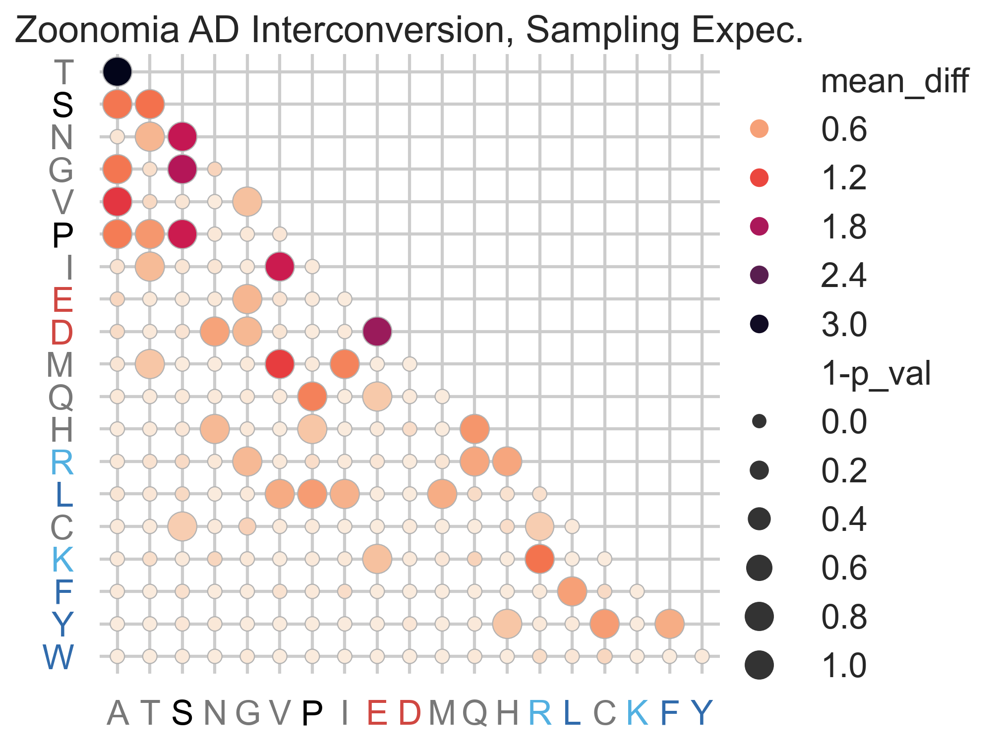

In [62]:
sns.set_theme(style="whitegrid", rc={"figure.dpi": 300})
sns.set_context('talk')

# Draw each cell as a scatter point with varying size and color
g = sns.relplot(
    data=sampling_p_val_df,
    x="new_AA1", y="new_AA2", hue="mean_diff", size="1-p_val",
    palette="rocket_r", edgecolor=".7",
    height=5.5, sizes=(10, 200), size_norm=(-.2, .8),
)

# Tweak the figure to finalize
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.03)

x_labels = g.ax.get_xticklabels()
for i, label in enumerate(x_labels):
    label.set_color(amino_acid_colors_white[str(label)[-3]])

y_labels = g.ax.get_yticklabels()
for i, label in enumerate(y_labels):
    label.set_color(amino_acid_colors_white[str(label)[-3]])

plt.title("Zoonomia AD Interconversion, Sampling Expec.");

In [63]:
mean_percent_changes = melted[["variable", "value"]].groupby("variable").mean().reset_index()
mean_percent_changes["value"] = mean_percent_changes["value"] * 100
mean_percent_changes = mean_percent_changes.rename(columns = {"variable" : "pair"})
mean_percent_changes

,pair,value
0,AC,0.014901
1,AD,0.131403
2,AE,0.165629
3,AF,0.013482
4,AG,0.903322
...,...,...
185,TW,0.003199
186,TY,0.003145
187,VW,0.005086
188,VY,0.003584


In [64]:
p_val_df = pd.merge(p_val_df, mean_percent_changes)
p_val_df

,pair,p_val,value
0,AC,1.000000,0.014901
1,AD,1.000000,0.131403
2,AE,0.999998,0.165629
3,AF,1.000000,0.013482
4,AG,0.000000,0.903322
...,...,...,...
185,TW,1.000000,0.003199
186,TY,1.000000,0.003145
187,VW,1.000000,0.005086
188,VY,1.000000,0.003584


In [65]:
p_val_df["AA1"] = p_val_df["pair"].str[0]
p_val_df["AA2"] = p_val_df["pair"].str[1]
p_val_df

,pair,p_val,value,AA1,AA2
0,AC,1.000000,0.014901,A,C
1,AD,1.000000,0.131403,A,D
2,AE,0.999998,0.165629,A,E
3,AF,1.000000,0.013482,A,F
4,AG,0.000000,0.903322,A,G
...,...,...,...,...,...
185,TW,1.000000,0.003199,T,W
186,TY,1.000000,0.003145,T,Y
187,VW,1.000000,0.005086,V,W
188,VY,1.000000,0.003584,V,Y


In [66]:
p_val_new_AA1s = []
p_val_new_AA2s = []

for i in range(len(p_val_df)):
    AA1 = p_val_df["AA1"].iloc[i]
    AA2 = p_val_df["AA2"].iloc[i]
    if AA_order_dict[AA1] < AA_order_dict[AA2]:
        p_val_new_AA1s.append(AA1)
        p_val_new_AA2s.append(AA2)
    else:
        p_val_new_AA2s.append(AA1)
        p_val_new_AA1s.append(AA2)

In [67]:
p_val_df["new_AA1"] = p_val_new_AA1s
p_val_df["new_AA2"] = p_val_new_AA2s
p_val_df

,pair,p_val,value,AA1,AA2,new_AA1,new_AA2
0,AC,1.000000,0.014901,A,C,A,C
1,AD,1.000000,0.131403,A,D,A,D
2,AE,0.999998,0.165629,A,E,A,E
3,AF,1.000000,0.013482,A,F,A,F
4,AG,0.000000,0.903322,A,G,A,G
...,...,...,...,...,...,...,...
185,TW,1.000000,0.003199,T,W,T,W
186,TY,1.000000,0.003145,T,Y,T,Y
187,VW,1.000000,0.005086,V,W,V,W
188,VY,1.000000,0.003584,V,Y,V,Y


In [68]:
p_val_df['sort_order'] = pd.Categorical(p_val_df['new_AA1'], ordered=True, categories=list(AA_order_dict.keys()))
p_val_df['sort_order2'] = pd.Categorical(p_val_df['new_AA2'], ordered=True, categories=list(AA_order_dict.keys()))
p_val_df = p_val_df.sort_values(['sort_order', 'sort_order2'])
p_val_df["1-p_val"] = 1 - p_val_df["p_val"]
p_val_df

,pair,p_val,value,AA1,AA2,new_AA1,new_AA2,sort_order,sort_order2,1-p_val
15,AT,0.000000e+00,3.131410,A,T,A,T,A,T,1.000000e+00
14,AS,0.000000e+00,0.896553,A,S,A,S,A,S,1.000000e+00
10,AN,1.000000e+00,0.050960,A,N,A,N,A,N,0.000000e+00
4,AG,0.000000e+00,0.903322,A,G,A,G,A,G,1.000000e+00
16,AV,0.000000e+00,1.312756,A,V,A,V,A,V,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...
134,KY,1.000000e+00,0.001237,K,Y,K,Y,K,Y,0.000000e+00
133,KW,1.000000e+00,0.001317,K,W,K,W,K,W,5.873080e-14
84,FY,1.546622e-26,0.511233,F,Y,F,Y,F,Y,1.000000e+00
83,FW,1.000000e+00,0.011904,F,W,F,W,F,W,7.205347e-14


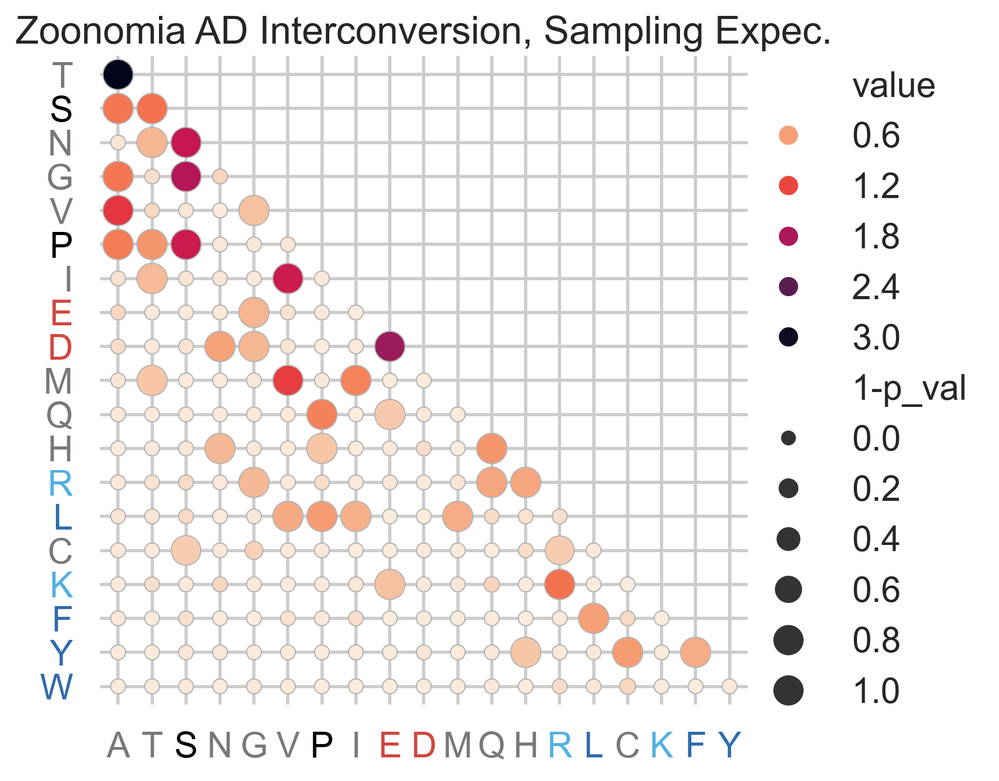

In [69]:
sns.set_theme(style="whitegrid", rc={"figure.dpi": 300})
sns.set_context('talk')

# Draw each cell as a scatter point with varying size and color
g = sns.relplot(
    data=p_val_df,
    x="new_AA1", y="new_AA2", hue="value", size="1-p_val",
    palette="rocket_r", edgecolor=".7",
    height=5.5, sizes=(10, 200), size_norm=(-.2, .8),
)

# Tweak the figure to finalize
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.03)

x_labels = g.ax.get_xticklabels()
for i, label in enumerate(x_labels):
    label.set_color(amino_acid_colors_white[str(label)[-3]])

y_labels = g.ax.get_yticklabels()
for i, label in enumerate(y_labels):
    label.set_color(amino_acid_colors_white[str(label)[-3]])

plt.title("Zoonomia AD Interconversion, Sampling Expec.");

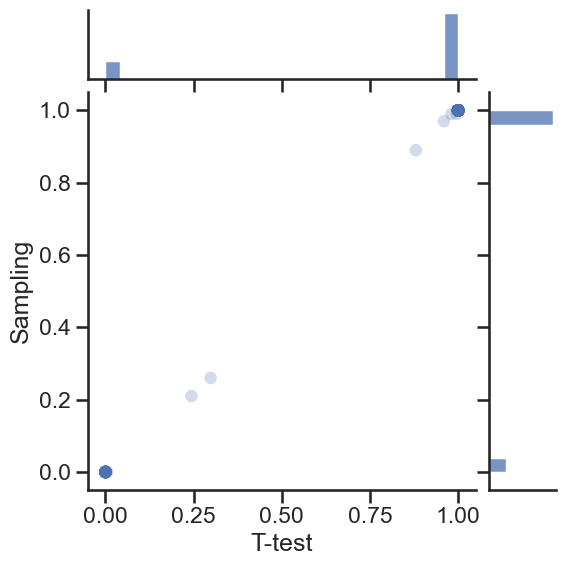

In [70]:
# Both p-value methods are consistent with one another
sns.set_theme(style="ticks", rc={"figure.dpi": 100})
sns.set_context('talk')
sns.jointplot(data = pd.merge(p_val_df, sampling_p_val_df, on = "pair"),
                x = "p_val_x",
                y = "p_val_y",
               edgecolor = "none",
               alpha = 0.25,
             marginal_kws=dict(bins=25))
plt.xlabel("T-test")
plt.ylabel("Sampling")
sns.despine();

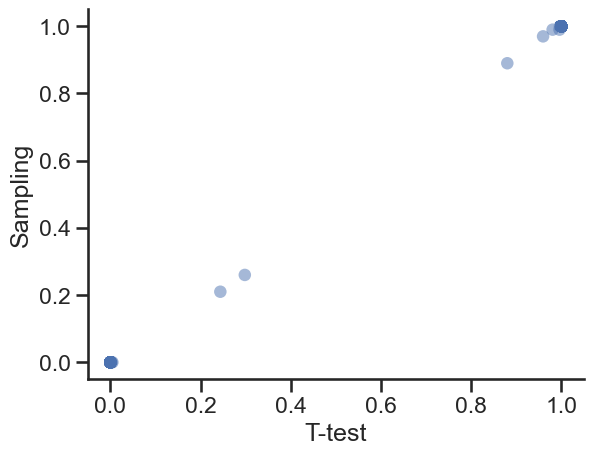

In [71]:
sns.set_theme(style="ticks", rc={"figure.dpi": 100})
sns.set_context('talk')
sns.scatterplot(data = pd.merge(p_val_df, sampling_p_val_df, on = "pair"),
                x = "p_val_x",
                y = "p_val_y",
               edgecolor = "none",
               alpha = 0.5)
plt.xlabel("T-test")
plt.ylabel("Sampling")
sns.despine();

# Chi Squared test
- Enrichment for >20% change in percent identity?

In [178]:
len(melted) / 19

78050.0

Text(0.5, 1.0, 'Zoomonia AD Interconversion')

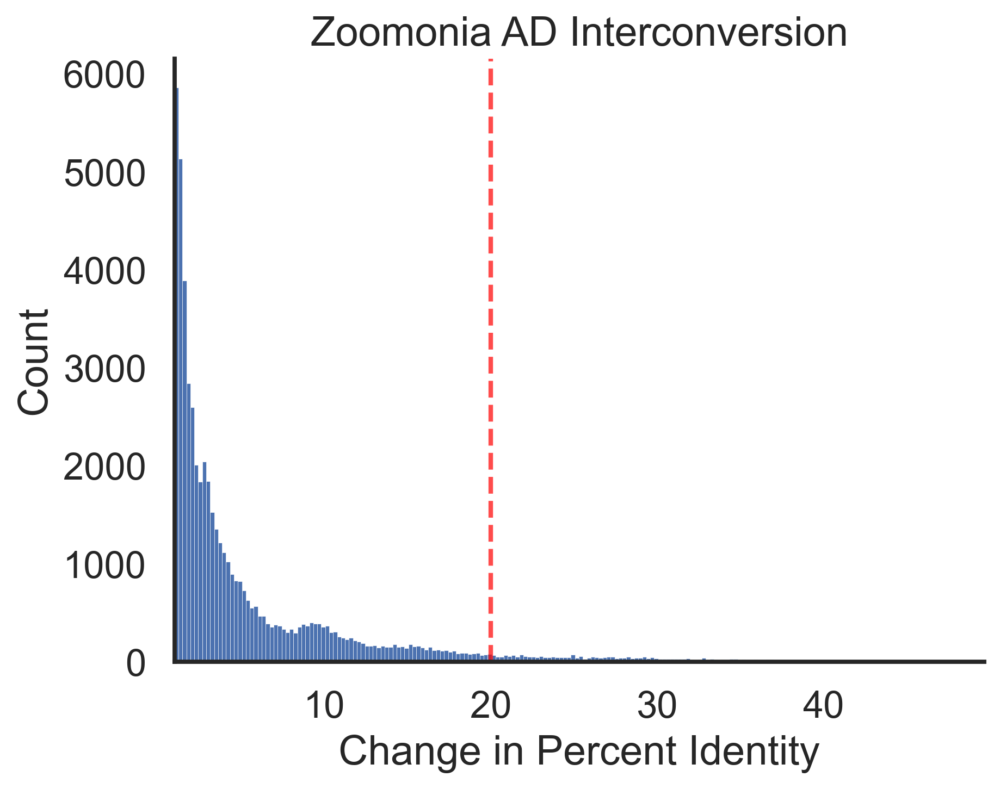

In [175]:
sns.set_style('white')
sns.histplot(melted[melted["value"] >= 0.01] * 100, bins = 200, alpha = 1, legend = False)
plt.axvline(20, color = "red", linestyle = "--", lw = 2, alpha = 0.7)
#plt.ylim(0, 10000)
plt.xlim(1, max(melted["value"]) * 100 + 1)
sns.despine()
plt.xlabel("Change in Percent Identity")
plt.title("Zoomonia AD Interconversion")

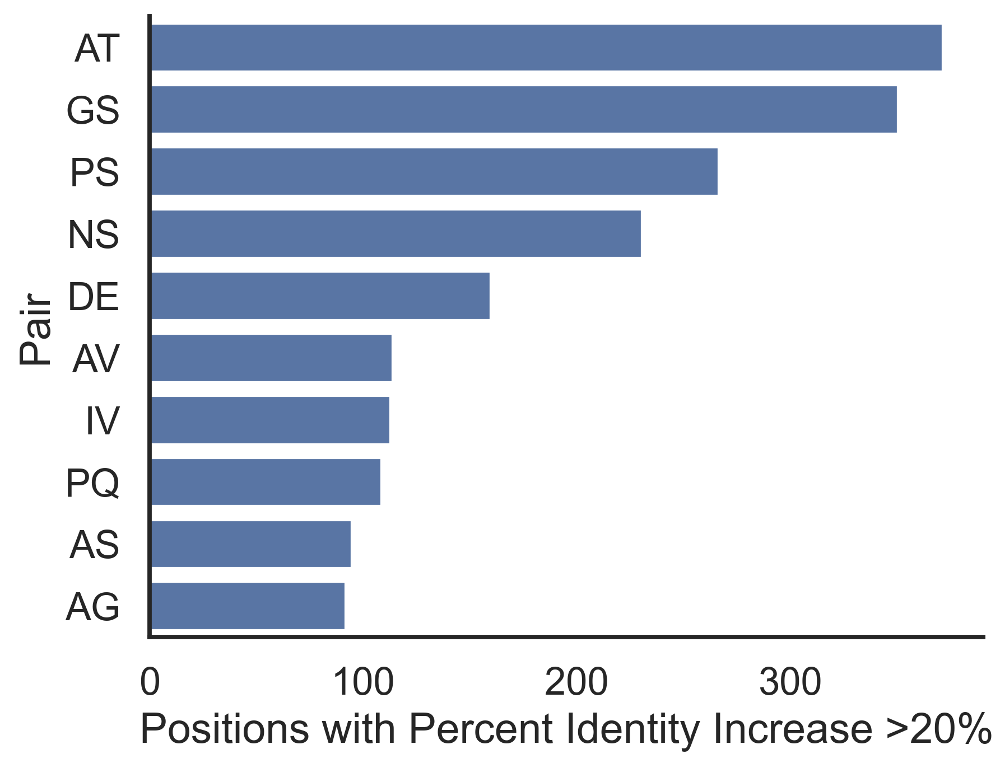

In [227]:
sns.set_style('white')
sns.barplot(data = pd.DataFrame(melted[melted["value"] >= 0.2].groupby("variable").size()).reset_index().sort_values(by = 0, ascending = False)[:10],
             y = "variable", 
             x = 0, orient = "h")
sns.despine()
plt.title("")
plt.xlabel("Positions with Percent Identity Increase >20%")
plt.ylabel("Pair");

In [229]:
len(melted[melted["value"] > 0.2])

3052

In [230]:
len(melted[melted["value"] <= 0.2])

1479898

In [231]:
expec_over_20_prop = len(melted[melted["value"] > 0.2]) / len(melted[melted["value"] <= 0.2])
expec_over_20_prop

0.0020623042939445827

Null hypothesis:
There are num pair rows * 0.002 changes above 20%

In [98]:
from scipy.stats import chisquare

In [102]:
melted

,index,variable,value
8,A,AC,0.0
12,A,AC,0.0
18,A,AC,0.0
27,A,AC,0.0
31,A,AC,0.0
...,...,...,...
15020454,W,WY,0.0
15020567,Y,WY,0.0
15020571,W,WY,0.0
15020605,Y,WY,0.0


In [232]:
variables = []
chi_sq_p_vals = []
diff_in_over = []

for variable in set(melted['variable']):
#for variable in ["AC"]:
    df = melted[melted["variable"] == variable]
    expec_over = len(df) * expec_over_20_prop
    expec_under = len(df) - expec_over

    obs_over = len(df[df["value"] > 0.2])
    obs_under =  len(df[df["value"] <= 0.2])
    
    # print(expec_over, expec_under)
    # print(obs_over, obs_under)

    variables.append(variable)
    chi_sq_p_vals.append(chisquare(f_obs=[obs_over, obs_under], 
                    f_exp=[expec_over, expec_under])[1])
    diff_in_over.append(obs_over - expec_over)



In [233]:
chi_sq_results = pd.DataFrame({"variable" : variables,
                               "chi_sq_p_val" : chi_sq_p_vals,
                               "diff_over" : diff_in_over})
chi_sq_results

,variable,chi_sq_p_val,diff_over
0,AD,0.000722,-15.753186
1,FG,0.000021,-18.063723
2,HY,0.953986,0.171275
3,RY,0.001669,-9.861939
4,LW,0.000419,-14.174653
...,...,...,...
185,VY,0.000520,-12.019109
186,HI,0.003096,-8.731796
187,AR,0.000017,-18.412253
188,AI,0.000025,-17.746128


In [234]:
sig_chi_sq_results = chi_sq_results[chi_sq_results["chi_sq_p_val"] < 0.05 / 190]
pos_diff = sig_chi_sq_results[sig_chi_sq_results["diff_over"] > 0]
pos_diff.sort_values(by = "diff_over", ascending = False)

,variable,chi_sq_p_val,diff_over
8,AT,0.000000e+00,350.440671
155,GS,0.000000e+00,318.102557
160,PS,0.000000e+00,231.254297
99,NS,0.000000e+00,206.706273
44,DE,3.948288e-234,141.266028
109,IV,9.234221e-189,101.077819
182,AV,1.636045e-92,92.430577
67,PQ,1.679254e-58,82.666436
5,AG,6.255226e-37,64.852044
87,AS,2.230843e-30,63.857143


In [235]:
chi_sq_results

,variable,chi_sq_p_val,diff_over
0,AD,0.000722,-15.753186
1,FG,0.000021,-18.063723
2,HY,0.953986,0.171275
3,RY,0.001669,-9.861939
4,LW,0.000419,-14.174653
...,...,...,...
185,VY,0.000520,-12.019109
186,HI,0.003096,-8.731796
187,AR,0.000017,-18.412253
188,AI,0.000025,-17.746128


In [236]:
chi_sq_results["AA1"] = chi_sq_results["variable"].str[0]
chi_sq_results["AA2"] = chi_sq_results["variable"].str[1]
chi_sq_results

,variable,chi_sq_p_val,diff_over,AA1,AA2
0,AD,0.000722,-15.753186,A,D
1,FG,0.000021,-18.063723,F,G
2,HY,0.953986,0.171275,H,Y
3,RY,0.001669,-9.861939,R,Y
4,LW,0.000419,-14.174653,L,W
...,...,...,...,...,...
185,VY,0.000520,-12.019109,V,Y
186,HI,0.003096,-8.731796,H,I
187,AR,0.000017,-18.412253,A,R
188,AI,0.000025,-17.746128,A,I


In [237]:
chi_p_val_new_AA1s = []
chi_p_val_new_AA2s = []

for i in range(len(p_val_df)):
    AA1 = chi_sq_results["AA1"].iloc[i]
    AA2 = chi_sq_results["AA2"].iloc[i]
    if AA_order_dict[AA1] < AA_order_dict[AA2]:
        chi_p_val_new_AA1s.append(AA1)
        chi_p_val_new_AA2s.append(AA2)
    else:
        chi_p_val_new_AA2s.append(AA1)
        chi_p_val_new_AA1s.append(AA2)

chi_sq_results["new_AA1"] = chi_p_val_new_AA1s
chi_sq_results["new_AA2"] = chi_p_val_new_AA2s


chi_sq_results['sort_order'] = pd.Categorical(chi_sq_results['new_AA1'], ordered=True, categories=list(AA_order_dict.keys()))
chi_sq_results['sort_order2'] = pd.Categorical(chi_sq_results['new_AA2'], ordered=True, categories=list(AA_order_dict.keys()))
chi_sq_results = chi_sq_results.sort_values(['sort_order', 'sort_order2'])
chi_sq_results["1-p_val"] = 1 - chi_sq_results["chi_sq_p_val"]
chi_sq_results

,variable,chi_sq_p_val,diff_over,AA1,AA2,new_AA1,new_AA2,sort_order,sort_order2,1-p_val
8,AT,0.000000e+00,350.440671,A,T,A,T,A,T,1.000000
87,AS,2.230843e-30,63.857143,A,S,A,S,A,S,1.000000
43,AN,4.536774e-05,-17.544240,A,N,A,N,A,N,0.999955
5,AG,6.255226e-37,64.852044,A,G,A,G,A,G,1.000000
182,AV,1.636045e-92,92.430577,A,V,A,V,A,V,1.000000
...,...,...,...,...,...,...,...,...,...,...
20,KY,2.339127e-03,-9.243248,K,Y,K,Y,K,Y,0.997661
10,KW,1.424513e-02,-5.995119,K,W,K,W,K,W,0.985755
89,FY,1.741303e-01,4.241176,F,Y,F,Y,F,Y,0.825870
56,FW,1.064194e-02,-6.510695,F,W,F,W,F,W,0.989358


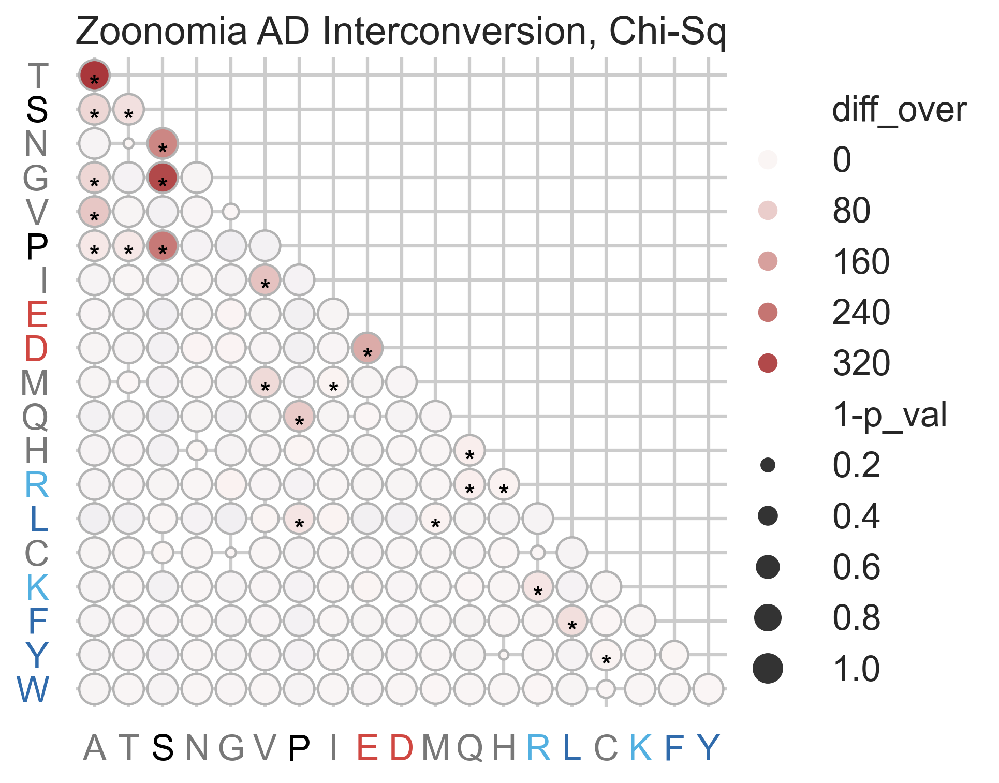

In [238]:
# Make histogram of results too

sns.set_theme(style="whitegrid", rc={"figure.dpi": 300})
sns.set_context('talk')

# Draw each cell as a scatter point with varying size and color
g = sns.relplot(
    data=chi_sq_results,
    x="new_AA1", y="new_AA2", 
    hue="diff_over", size="1-p_val",
    palette=sns.color_palette("vlag", as_cmap=True), edgecolor=".7",
    height=5.5, sizes=(10, 200), size_norm=(0, 1), 
    hue_norm=(-1 * max(np.abs(chi_sq_results["diff_over"])), max(np.abs(chi_sq_results["diff_over"])))
)

# Tweak the figure to finalize
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.03)

x_labels = g.ax.get_xticklabels()
for i, label in enumerate(x_labels):
    label.set_color(amino_acid_colors_white[str(label)[-3]])

y_labels = g.ax.get_yticklabels()
for i, label in enumerate(y_labels):
    label.set_color(amino_acid_colors_white[str(label)[-3]])

sig_chi_sq_results = chi_sq_results[chi_sq_results["chi_sq_p_val"] < 0.05/190]
pos_sig_chi_sq_results = sig_chi_sq_results[sig_chi_sq_results["diff_over"] > 0]
for i in range(len(pos_sig_chi_sq_results)):
    g.ax.text(
            pos_sig_chi_sq_results["new_AA1"].iloc[i], pos_sig_chi_sq_results["new_AA2"].iloc[i], 
            "*", color="black", ha="center", va="top", 
            fontsize=12, fontweight="bold"
        )

#g.figure.colorbar(g.ax.collections[0], ax=g.ax, orientation="horizontal")

plt.title("Zoonomia AD Interconversion, Chi-Sq");